In [190]:
import argparse
import os
import pickle
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.insert(1, '../')
from utils.utils_NMT import get_ckpt_folder, get_epochs, mk_metrics_folder, get_experiment_folders_and_epochs
from utils.utils_analyze_plots import get_ESD

import matplotlib.image as mpimg
from os import listdir
from os.path import isfile, join
import re
from scipy import stats
import math
from itertools import compress

In [191]:
#blue, yellow, red = '#91bfdb', '#ffffbf', '#fc8d59'
blue, yellow, red = '#4292c2', '#ffffbf', '#f05004'
darkgreen, purple, black = '#378915', '#C32FC1', '#000000'
green, pink, gray = '#42E301', '#FC9DFF', 'A4A4A4'

# Checking the results of NMT using ww

In [192]:
class arguments:
    "Argument class"
    
    def __init__(self):
        self.directory_depth = 1 # the 'visualization' folder is one level down from the root directory
        self.dataset = 'IWSLT' # choice ['IWSLT', 'WMT']
        self.training_type = 'normal' # choice ['const_lr', 'normal']
        self.experiment_type = 'width' # choice ['sample', 'lr']
        self.second_exp = False
        self.mkdir = False
        self.IWSLT_width = 128
        self.only20 = False
        self.folder_suffix = ''
        self.exclude_standard = True

# Select the weightwatcher files and ESD files

In [193]:
# The following contains all the different ww settings that we have tried

def get_ww_and_loss_file(ckpt_folder, epoch):
    
    #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30_heuMax_1.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_fix_finger.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_rand_distance.pkl')
    ww_result = os.path.join(ckpt_folder, 'metrics_expcutoff', f'epoch_{epoch}', 'results.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_expcutoff_positive_lambda', f'epoch_{epoch}', 'results.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_lognormal', f'epoch_{epoch}', 'results.pkl')
    #ww_result = os.path.join(ckpt_folder, 'metrics_exponential', f'epoch_{epoch}', 'results.pkl')
    loss_result = os.path.join(ckpt_folder, 'log_0.txt')

    return ww_result, loss_result

# The following has to be changed to match the change above

metric_folder_name = 'metrics_expcutoff'
#metric_folder_name = 'metrics'

# Other useful functions

In [194]:
from utils.utils_ww_results import get_ww_layer_feature, compute_alpha_from_Ds, get_alphas_Ds, get_ww_alpha
from utils.utils_ww_results import get_ww_alpha_from_Ds, get_ww_layer_alpha, get_ww_result, get_ww_layer_metrics
from utils.utils_ww_results import get_per_layer_curves_one_epoch, get_all_layers, get_all_layers_square
from utils.utils_NMT import get_val_loss, get_bleu_score, smooth, get_train_loss, get_bleu_gap

In [195]:
def plot_all_layers(ckpt_folder, epochs, layer_ids = [21, 22], ESD_type = 1, save=None, from_Ds=False, plot_difference=False):
    
    #print(len(epochs))
    #print(len(layer_ids))
    
    fig, axs = plt.subplots(len(epochs), len(layer_ids), figsize=(2.5*len(layer_ids), 2.5*len(epochs)))
    
    for row, epoch in enumerate(epochs):
        print("Starting epoch {0}".format(epoch))
        
        if from_Ds:
            
            ww_result, _ = get_ww_and_loss_file(ckpt_folder, epoch)
            alphas, Ds = get_alphas_Ds(ww_result)
            if epoch>0:
                ww_result_previous, _ = get_ww_and_loss_file(ckpt_folder, epoch-1)
                alphas_previous, Ds_previous = get_alphas_Ds(ww_result_previous)
            
        for col, layer_id in enumerate(layer_ids):

            ax = axs[row, col]
            
            if not from_Ds:
                ESD_result = get_ESD(ckpt_folder, epoch, ESD_type=ESD_type, layer_id=layer_id, 
                                    metric_folder_name = metric_folder_name)
                img = mpimg.imread(ESD_result)
                ax.imshow(img)
                ax.axis('off')
            else:
                alphas_layer = alphas[layer_id]
                if epoch >0 and plot_difference:
                    alphas_layer = alphas[layer_id] - alphas_previous[layer_id]
                    
                if epoch>0 and layer_id==291:
                    print(f"Epoch = {epoch}")
                    print(f"Alpha maximum value is {max(alphas[layer_id])}")
                
                if not plot_difference or epoch==0:
                    ax.plot(alphas_layer)
                else:
                    ax.plot(alphas_layer, 'r')
                    ax.plot(-alphas_layer, 'b')
                ax.set_title(f'Alphas for layer {layer_id}')
                ax.set_ylim([0,7])
                ax.grid()
                
    plt.tight_layout()
    if save:
        plt.savefig(save, dpi=300)
        plt.clf()
    else:
        plt.show()
        

In [196]:
def plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=False, 
              ESD=False, layer_id = 105, ESD_type = 1, save=None, per_layer='alpha',
             get_alpha_from_Ds=False, from_Ds=False, plot_layer_curves=False, layer_ids=[], 
              special_legend=None, additional_keys=[], min_alpha=False, divide=10, ymax=0):
    
    if not draw_per_epoch:
        fig, axs = plt.subplots(1, len(ckpt_folders), figsize=(5*len(ckpt_folders),4))
    else:
        lengths = [len(epoch_collections[i]) for i in range(len(epoch_collections))]
        fig, axs = plt.subplots(max(lengths), len(ckpt_folders), figsize=(2.5*len(ckpt_folders), 2.5*len(epoch_collections[0])))
            
    constant_lr = args.training_type == 'const_lr'
    if args.second_exp:
        width_list = [64, 128, 256, 512]
    else:
        width_list = [128, 256, 512, 768, 1024, 1536]
    if args.dataset == 'IWSLT':
        sample_list = [10000, 20000, 40000, 80000, 160000]
    elif args.dataset == 'WMT':
        sample_list = [160000, 320000, 640000, 1280000]
    lr_factor_list = ['0.25', '0.5', '1', '2', '4']

    if args.experiment_type == 'width':
        val_list = width_list
        val_type = 'Embedding width'
    elif args.experiment_type == 'sample':
        val_list = sample_list
        val_type = 'Num samples'
    elif args.experiment_type == 'lr':
        val_list = lr_factor_list
        val_type = 'Lr'
    elif args.experiment_type == 'CV':
        val_list = [18]
        val_type = 'ResNet'

    keys = ['log_norm', 'alpha', 'alpha_weighted', 'log_alpha_norm', 'log_spectral_norm', 'stable_rank', 'D']
    if per_layer=='spikes':
        keys += ['rand_num_spikes']
    if len(additional_keys)>0:
        for key in additional_keys:
            if key not in keys:
                keys.append(key)
    if plot_layer_curves:
        keys += ['D']

    # these are the validation loss at the beginning of training. Some checkpoints to not have these values
    val_losses_at_beginning = {64:7.588486796931217, 128:7.591086287247507, 256:7.581291248923854, 512:7.59, 768: 7.79, 1024:7.59, 1536: 7.59}

    for col, val in enumerate(val_list):
        
        ax = axs[col]
        
        plot_result = {key:[] for key in keys}
        ckpt_folder = ckpt_folders[col]
        epochs = epoch_collections[col]
        
        missing_results = False
        # get plots for different epochs
        
        if plot_layer_curves:
            plot_result = {key:{layer:[] for layer in layer_ids} for key in keys}                
        
        for row, epoch in enumerate(epochs):
            
            ww_result, loss_result = get_ww_and_loss_file(ckpt_folder, epoch)
            
            if plot_layer_curves:
                get_per_layer_curves_one_epoch(plot_result, ww_result, keys, layer_ids, from_Ds=from_Ds)
                continue
                
            if (not os.path.exists(ww_result)) or (not os.path.exists(loss_result)):
                print(f'Missing result {ww_result} or {loss_result}')
                missing_results = True
                break
            get_ww_result(plot_result, ww_result, keys, get_alpha_from_Ds=get_alpha_from_Ds, min_alpha=min_alpha)
            if not draw_per_epoch:
                get_bleu_score(plot_result, loss_result, divide=divide)
                get_val_loss(plot_result, loss_result)
                get_train_loss(plot_result, loss_result)
            
            # new_things
            
            if draw_per_epoch:
                ax = axs[row, col]
                if not ESD:
                    if per_layer=='alpha':
                        alpha_values = get_ww_layer_alpha(ww_result, from_Ds=from_Ds)
                    else:
                        alpha_values = get_ww_layer_metrics(ww_result, per_layer)
                        print(alpha_values)
                    alpha_value = get_ww_alpha(ww_result)
                    ax.scatter(np.arange(len(alpha_values)), alpha_values, c='r')

                    ax.set_title(f'Epoch-{epoch}, {val_type}={val}\nalpha={alpha_value}', fontsize=10)
                    if per_layer=='alpha':
                        ax.set_ylabel('Per-module alpha', fontsize=10)
                    else:
                        ax.set_ylabel(f'Per-module {per_layer}', fontsize=10)
                    ax.set_xlabel('Module index', fontsize=10)
                    ax.set_ylim([0, 3])
                else:
                    ESD_result = get_ESD(ckpt_folder, epoch, ESD_type=ESD_type, layer_id=layer_id,
                                        metric_folder_name = metric_folder_name)
                    img = mpimg.imread(ESD_result)
                    ax.imshow(img)
                    ax.axis('off')
        
        if missing_results:
            
            print(f"Missing results for val={val}. Continue to next value")
            continue
            
        # get the plots for the whole training
        if not draw_per_epoch:
            
            #print("Pointing to this part")
            
            if args.experiment_type == 'width':
                epochs = [x+1 for x in epochs]
            
            if plot_layer_curves:
                
                for key in ['D']:
                    for layer in layer_ids:
                        ax.plot(epochs, plot_result[key][layer])
            
            elif len(additional_keys)==0:
                
                for key in ['alpha']:
                #for key in ['log_spectral_norm']:
                    #print('smoothing alpha')
                    #alpha_results = smooth(plot_result[key], 5)
                    alpha_results = plot_result[key]
                    if special_legend:
                        #print("Pointing to that part")
                        ax.plot(epochs, alpha_results, marker = 'o', label=special_legend)
                    else:
                        print('alpha')
                        print(alpha_results)
                        ax.plot(epochs, alpha_results, label=key, marker = 'o')

                #for key in ['training_loss']:
                #    ax.plot(np.linspace(min(epochs), max(epochs), len(plot_result[key])), plot_result[key], label=key)    

                #for key in ['bleu_score', 'validation_loss']:
                for key in ['bleu_score']:
                    if args.experiment_type == 'width' :
                        if not constant_lr and (val!=512 and val!=768 and val!=1024 and val!=1536):
                            if key == 'validation_loss':
                                ax.plot(epochs, [val_losses_at_beginning[val]]+plot_result[key][:-1], label=key, marker = 'o')
                            else:
                                ax.plot(epochs, plot_result[key], label=key, marker = 'o')
                        else:
                            if key == 'validation_loss':
                                ax.plot(epochs, plot_result[key][:-1], label=key, marker = 'o')
                            else:
                                ax.plot(epochs, plot_result[key], label=key, marker = 'o')
                    elif args.experiment_type == 'sample' or args.experiment_type == 'lr':
                        label=key
                        if key=='bleu_score':
                            print('bleu_score')
                            print(plot_result[key])
                            if divide!=1:
                                label= f'bleu_score divided by {divide}'
                            else:
                                label= 'bleu_score'
                                
                            ax.plot(np.linspace(max(min(epochs), 0), max(epochs),len(plot_result[key])), plot_result[key], label=label)      
                        elif key=='validation_loss':
                            ax.plot(np.linspace(0, max(epochs),len(plot_result[key])), plot_result[key], label=label)
            
            else:                
                get_bleu_score(plot_result, loss_result, divide=divide)
                for key in additional_keys:
                    print(key)
                    print(plot_result[key])
                    curve_key, =ax.plot(epochs, plot_result[key], 'o-', color=red, label=key)
                
                print('bleu_score')
                print(plot_result['bleu_score'])
                if divide!=1:
                    label= f'bleu_score divided by {divide}'
                else:
                    label= 'bleu_score'
                ax.set_ylabel(key.lower(), fontsize=20)
                ax.yaxis.label.set_color(curve_key.get_color())
                ax.spines["right"].set_edgecolor(curve_key.get_color())
                ax.tick_params(axis='y', colors=curve_key.get_color())
                ax.tick_params(axis='both', which='major', labelsize=14)
                ax.tick_params(axis='both', which='minor', labelsize=12)
                
                # Use the second axis to plot the bleu score
                ax_bleu = ax.twinx()
                ax_bleu.set_ylim([0, 50])
                curve_bleu, = ax_bleu.plot(np.linspace(max(min(epochs), 0), max(epochs),len(plot_result['bleu_score'])), plot_result['bleu_score'], 'o-', color=blue)
                #ax_bleu.plot(np.linspace(max(min(epochs), 0), max(epochs),len(plot_result['bleu_score'])), plot_result['bleu_score'], label=label)
                ax_bleu.set_ylabel('BLEU score', fontsize=20)
                ax_bleu.yaxis.label.set_color(curve_bleu.get_color())
                ax_bleu.spines["right"].set_edgecolor(curve_bleu.get_color())
                ax_bleu.tick_params(axis='y', colors=curve_bleu.get_color())
                ax_bleu.tick_params(axis='both', which='major', labelsize=14)
                ax_bleu.tick_params(axis='both', which='minor', labelsize=12)
                ax_bleu.grid(color=curve_bleu.get_color(), linestyle='--', linewidth=0.5)
                
            ax.set_title(f'{val_type} = {val}', fontsize=20)
            
            ax.set_xlabel('Epoch number', fontsize=20)
            if ymax:
                ax.set_ylim([0, ymax])
            elif len(additional_keys)>0:
                ax.set_ylim([0, 0.08])
            elif plot_layer_curves:
                ax.set_ylim([0,0.3])
            else:
                ax.set_ylim([0,10])
            
            if not draw_per_epoch and not len(additional_keys)==0:
                pass
            else:
                ax.legend(fontsize=16)
                ax.set_ylabel('Value', fontsize=20)
    
    plt.tight_layout()
    if save:
        plt.savefig(save, dpi=300)
        plt.clf()
    else:
        plt.show()

# NLP results

In [197]:
mypath = '../../checkpoint/NMT_epochs/IWSLT/w64/normal/metrics/epoch_0/'
all_layers = get_all_layers(mypath)
all_layers_square = get_all_layers_square(mypath)

[2, 4, 21, 22, 23, 24, 28, 29, 42, 43, 44, 45, 49, 50, 63, 64, 65, 66, 70, 71, 84, 85, 86, 87, 91, 92, 105, 106, 107, 108, 112, 113, 126, 127, 128, 129, 133, 134, 153, 154, 155, 156, 161, 162, 163, 164, 168, 169, 185, 186, 187, 188, 193, 194, 195, 196, 200, 201, 217, 218, 219, 220, 225, 226, 227, 228, 232, 233, 249, 250, 251, 252, 257, 258, 259, 260, 264, 265, 281, 282, 283, 284, 289, 290, 291, 292, 296, 297, 313, 314, 315, 316, 321, 322, 323, 324, 328, 329, 334]
[21, 22, 23, 24, 42, 43, 44, 45, 63, 64, 65, 66, 84, 85, 86, 87, 105, 106, 107, 108, 126, 127, 128, 129, 153, 154, 155, 156, 161, 162, 163, 164, 185, 186, 187, 188, 193, 194, 195, 196, 217, 218, 219, 220, 225, 226, 227, 228, 249, 250, 251, 252, 257, 258, 259, 260, 281, 282, 283, 284, 289, 290, 291, 292, 313, 314, 315, 316, 321, 322, 323, 324]


# Alpha values for models trained with different samples

rand_distance
[0.002612954568098831, 0.002579593329271974, 0.130392762300463, 0.20473626933159764, 0.22218510990751544, 0.22928259199333262, 0.23267831085430757, 0.23420271790321148, 0.23460629440303554, 0.23433005411733346, 0.233697570107706, 0.23280447153538508, 0.23172628098110298, 0.23056153476812077, 0.22930015675873708, 0.22792926446641965, 0.22660726863339153, 0.2251735837636971, 0.22401822977802163, 0.22250850914610437, 0.22133200939982298]
bleu_score
[5.75593603900178e-230, 3.66794807380853, 7.535365933012758, 8.600089562145646, 10.403578986490933, 11.948239691618213, 11.51628813100208, 12.092618143215534, 12.76502352931527, 12.303711590239686, 12.815175064486048, 12.332559028298997, 12.763818202419868, 12.40198685435276, 12.902103974062834, 12.65296589837615, 12.981191162528502, 12.59717252327746, 12.692797400654737, 12.964193555404668, 12.607202732855379]
rand_distance
[0.0025936544097845287, 0.0026303374392534842, 0.2048657644511743, 0.23091326040957447, 0.23797656240806728

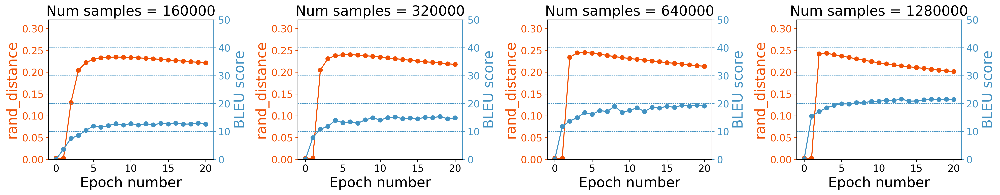

In [200]:
# You can choose between WMT or IWSLT (default)
args = arguments()
#args.training_type = 'no_dropout'
args.training_type = 'normal'
args.experiment_type = 'sample'
#args.dataset='IWSLT'
args.dataset='WMT'
args.IWSLT_width = 512
args.only20 = True
#args.folder_suffix = '_exp2'
args.folder_suffix = ''

plt.rcParams['figure.dpi'] = 300
ckpt_folders, epoch_collections, _, _, _, _ = get_experiment_folders_and_epochs(args)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['rand_num_spikes'])
plot_once(args, ckpt_folders, epoch_collections, additional_keys=['rand_distance'], divide=1, ymax=0.32)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['num_spikes'])
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['entropy'], divide=10, ymax=2)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['log_spectral_norm'], ymax=3, divide=1)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['alpha_weighted'])
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['stable_rank'], divide=1, ymax=50,)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['log_norm'])
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['D'], divide=100)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['log_alpha_norm'], divide=1)
#plot_once(args, ckpt_folders, epoch_collections)
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['exponent'], divide=1, ymax=0.1,)
#          save=f"results/{args.dataset}_{args.training_type}_exponent.pdf")
#plot_once(args, ckpt_folders, epoch_collections, min_alpha=True)
# This is for exponential distribution
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['exponent'], divide=100, ymax=0.8, )
# This is for lognormal distribution
#plot_once(args, ckpt_folders, epoch_collections, additional_keys=['sigma_var'], divide=10, ymax=30)

# Use the Ds to weight the alphas
#plot_once(args, ckpt_folders, epoch_collections, get_alpha_from_Ds=True, special_legend='alpha_weighted')
#plot_once(args, ckpt_folders, epoch_collections, get_alpha_from_Ds=True, special_legend='alpha')

# Plot alpha curves
#plot_once(args, ckpt_folders, epoch_collections, get_alpha_from_Ds=True, 
#              plot_layer_curves=True, layer_ids=all_layers, from_Ds=True)

#plt.rcParams['figure.dpi'] = 50
# results for per-layer alpha
# One can choose between using the temperature-averaged alphas or not
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, from_Ds=False)
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, from_Ds=True)
# results for per-layer spikes
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, per_layer='spikes')
# results for per-layer exponents
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, per_layer='exponent')

#plt.rcParams['figure.dpi'] = 300
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, ESD=True, layer_id = 329, ESD_type=1)

#plt.rcParams['figure.dpi'] = 300
#for layer_id in [322]:
#for layer_id in all_layers:
#    if layer_id > 0:
#        plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#                    ESD=True, layer_id = layer_id, ESD_type=1, save=f'results/SP_LARGE_ESD{layer_id}.png')
#        plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#                  ESD=True, layer_id = layer_id, ESD_type=1, save=None)

# ESD results for all the layers together
#plt.rcParams['figure.dpi'] = 150
#ckpt_folder, epochs = ckpt_folders[1], epoch_collections[1]
#print(ckpt_folder, epochs)
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[60:100], ESD_type = 1, 
#                save=f'results/ALL_LATER_LAYERS_{args.dataset}_SP_320000_ALPHA_LOG_LOG_PL_Normal.png')
#                save='results/ALL_LATER_LAYERS_WMT_SP_1280000_ALPHA_LOG_LOG_EXPCUTOFF_Normal.png')
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[60:100], ESD_type = 4, 
#                save='results/ALL_LATER_LAYERS_WMT_SP_1280000_KS.png')
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[60:100], ESD_type = 4, 
#                save='results/ALL_LATER_LAYERS_WMT_SP_1280000_ALPHA_XMIN_CURVE.png', from_Ds=True, plot_difference=False)


# Alpha values for models with different widths

In [ ]:
# You can choose between const_lr and normal. You can also set args.second_exp to be true for the const_lr experiment
args = arguments()
#args.training_type = 'no_dropout'
args.training_type = 'normal'
#args.second_exp = True
ckpt_folders, epoch_collections, _, _ = get_experiment_folders_and_epochs(args)
#plot_once(args, ckpt_folders, epoch_collections, draw_only_spikes=True)
plot_once(args, ckpt_folders, epoch_collections)

#plt.rcParams['figure.dpi'] = 50
# results for per-layer alpha
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True)
# results for per-layer spikes
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, per_layer='spikes')

#plt.rcParams['figure.dpi'] = 300
#for layer_id in [264]:
#for layer_id in all_layers[80:]:
#    plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#              ESD=True, layer_id = layer_id, ESD_type=1, save=f'results/WIDTH_INVLR_ESD{layer_id}.png')
#    #plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#    #          ESD=True, layer_id = layer_id, ESD_type=1, save=None)

# ESD results for all the layers together
#plt.rcParams['figure.dpi'] = 150
#ckpt_folder, epochs = ckpt_folders[2], epoch_collections[2]
#print(ckpt_folder, epochs)
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[60:80], ESD_type = 6, 
#                save='results/ALL_LAYERS_WIDTH_512_CONST_LR_MPFIT2_60_80.png')

# Alpha values for models trained with different learning rates

In [ ]:
# You can choose between WMT or IWSLT (default)
args = arguments()
#args.training_type = 'no_dropout'
args.training_type = 'normal'
args.experiment_type = 'lr'
args.dataset='IWSLT'
#args.dataset='WMT'
args.IWSLT_width = 512
args.only20 = True


ckpt_folders, epoch_collections, _, _ = get_experiment_folders_and_epochs(args)
plot_once(args, ckpt_folders, epoch_collections)
# Look at the number of spikes
#plot_once(args, ckpt_folders, epoch_collections, draw_only_spikes=True)

#plt.rcParams['figure.dpi'] = 50
# results for per-layer alpha
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True)
# results for per-layer spikes
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, per_layer='spikes')


#plt.rcParams['figure.dpi'] = 300
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, ESD=True, layer_id = 329, ESD_type=6)

#for layer_id in [264]:
#for layer_id in all_layers:
#    if layer_id > 113:
#        plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#                  ESD=True, layer_id = layer_id, ESD_type=1, save=f'results/LR_ESD{layer_id}.png')
#    #plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True, 
#    #          ESD=True, layer_id = layer_id, ESD_type=4, save=None)

# ESD results for all the layers together
#plt.rcParams['figure.dpi'] = 150
#ckpt_folder, epochs = ckpt_folders[4], epoch_collections[4]
#print(ckpt_folder, epochs)
# switch between square layers and ordinary layers below
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[80:100], ESD_type = 8, 
#                save='results/ALL_LAYERS_LR_4_RANDOMIZE2_80_100.png')
#plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers_square[:20], ESD_type = 5, 
#                save='results/ALL_LAYERS_LR_MIDDLE_MP_FIT1_0_20.png')

# Computing the rank correlation on the sample experiments

In [ ]:
from utils.utils_analyze_plots import change_dict_form, compute_correlation_single, compute_rank_correlation 
from utils.utils_analyze_plots import create_plot_result, aggregate_rank_correlations, average_rank_correlations, plot_rank_correlations 

keys = ['log_norm', 'alpha', 'alpha_weighted', 'log_alpha_norm', 'log_spectral_norm', 'stable_rank', 'mp_softrank', 'D']
#single_features = ['rand_distance', 'entropy', 'bulk_mean_vec_entropy', 'bulk_var_vec_entropy', 'tail_mean_vec_entropy', 'tail_var_vec_entropy', 'exponent']
single_features = ['rand_distance', 'entropy', 'bulk_mean_vec_entropy', 'tail_mean_vec_entropy', 'exponent']
exclude_metrics = ['FRO_OVER_SPEC', 'PARAMS', 'alpha', 'TRUE_MARGIN']

rank_correlations_min = {}
rank_correlations_ave = {}
rank_correlations_aggregated = {}

all_margins = []
all_sharpness = []

bleu_score_type = "test"
#bleu_score_type = "gap"


for training_type in ['normal', 'no_dropout']:
    for dataset in ['WMT', 'IWSLT']:
    #for dataset in ['WMT']:
        
        args = arguments()
        args.training_type = training_type
        args.dataset = dataset
        args.experiment_type = 'sample'
        #args.experiment_type = 'lr'
        #args.experiment_type = 'depth'
        args.IWSLT_width = 512
        args.only20 = True
        #args.correlation_type = 'pearsonr'
        args.correlation_type = 'spearmanr'
        #args.folder_suffix = '_exp2'

        if args.training_type=='no_dropout':
            training_type_suffix = 'without dropout'
        else:
            training_type_suffix = 'with dropout'

        plt.rcParams['figure.dpi'] = 150
        ckpt_folders, epoch_collections, _, _, _, _ = get_experiment_folders_and_epochs(args)
        figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))

        for ckpt_folder, epochs, ax in zip(ckpt_folders, epoch_collections, axs):

            num_samples = re.findall(r'\d+', ckpt_folder)[0]    
            
            mypath = os.path.join(ckpt_folder, 'robust_measures_include_margin.pkl')
            different_metrics = change_dict_form(mypath)
            
            # Results after getting the correct margin
            if args.folder_suffix == '' and args.experiment_type == 'sample':
                # This is the case when we have "true_margin" as one type of results
                mypath = os.path.join(ckpt_folder, 'robust_measures_true_margin.pkl')
                different_metrics2 = change_dict_form(mypath)
                
                for key in different_metrics2.keys():
                    if 'MARGIN' in key:
                        different_metrics[key] = different_metrics2[key]
                    if 'TRUE_MARGIN'==key:
                        all_margins.append(different_metrics[key])
            
            all_sharpness.append(different_metrics['PACBAYES_FLATNESS'])
            
            plot_result = create_plot_result(keys, single_features, exclude_metrics)
            loss_result = os.path.join(ckpt_folder, 'log_0.txt')
            bleu_result = os.path.join(ckpt_folder, 'bleu.pkl')
            if bleu_score_type == 'gap':
                get_bleu_gap(plot_result, bleu_result, divide=1)
            elif bleu_score_type == 'test':
                get_bleu_score(plot_result, loss_result, divide=1)
            else:
                raise ValueError('This BLEU type is not implemented!')
            
            for epoch in epochs:
                #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_rand_distance.pkl')
                #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_fix_finger.pkl')
                #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30.pkl')
                #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30_heuMax_1.pkl')
                #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results.pkl')
                #ww_result = os.path.join(ckpt_folder, 'metrics_expcutoff', f'epoch_{epoch}', 'results.pkl')

                ww_result1 = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results.pkl')
                get_ww_result(plot_result, ww_result1, keys, get_alpha_from_Ds=False)
                if args.experiment_type != 'sample':
                    for key in single_features:
                        if key!='exponent':
                            plot_result[key].append( np.mean(get_ww_layer_feature(ww_result1, key=key)))
                    
                ww_result2 = os.path.join(ckpt_folder, 'metrics_expcutoff', f'epoch_{epoch}', 'results.pkl')
                if args.experiment_type != 'sample':
                    key = 'exponent'
                    plot_result[key].append( np.mean(get_ww_layer_feature(ww_result2, key=key)))
                else:
                    for key in single_features:
                        plot_result[key].append( np.mean(get_ww_layer_feature(ww_result2, key=key)))

                # Add the keys for exponential distribution
                ww_result3 = os.path.join(ckpt_folder, 'metrics_exponential', f'epoch_{epoch}', 'results.pkl')
                plot_result['exp_dist_exponent'].append( np.mean(get_ww_layer_feature(ww_result3, key='exponent')))

                # Add the keys for lognormal distribution
                ww_result4 = os.path.join(ckpt_folder, 'metrics_lognormal', f'epoch_{epoch}', 'results.pkl')
                plot_result['lognormal_sigma'].append( np.mean(get_ww_layer_feature(ww_result4, key='sigma_var')))
            
            for key in keys:
                if key == 'D':
                    different_metrics['KS_distance'] = plot_result['D']
                else:
                    different_metrics[key] = plot_result[key]
                
            rank_correlations = compute_rank_correlation(plot_result, different_metrics, exclude_metrics = exclude_metrics, bleu_score_type=bleu_score_type,
                        correlation_type = args.correlation_type, single_features=['exp_dist_exponent','lognormal_sigma']+single_features)
            #rank_correlations = compute_rank_correlation(plot_result, different_metrics, exclude_metrics = exclude_metrics, bleu_score_type=bleu_score_type,
            #            correlation_type = args.correlation_type, single_features=single_features)
            
                                                         
            aggregate_rank_correlations(rank_correlations, rank_correlations_min, rank_correlations_ave, rank_correlations_aggregated)
                        
            plot_rank_correlations(rank_correlations, ax)
            
            ax.set_title(f"{args.dataset}, num samples={num_samples},\n training {training_type_suffix}")
            if args.correlation_type == 'pearsonr':
                ax.set_xlabel('Pearson correlation')
            elif args.correlation_type == 'spearmanr':
                ax.set_xlabel("Spearman's rank correlation")
            #ax.set_xticklabels(plot_keys, rotation=90)
            
        plt.tight_layout()
        plt.savefig(f"results/Rank_correlation_{args.dataset}_{num_samples}_samples_{args.training_type}.pdf")
        
average_rank_correlations(rank_correlations_ave)

print(rank_correlations_ave)

# Plot average rank correlations
figs, ax = plt.subplots(1,1,figsize=(5,7))
plot_rank_correlations(rank_correlations_ave, ax)

ax.set_title(f"Average rank correlations")
if args.correlation_type == 'pearsonr':
    ax.set_xlabel('Pearson correlation')
elif args.correlation_type == 'spearmanr':
    ax.set_xlabel("Spearman's rank correlation")
plt.tight_layout()
plt.savefig(f"results/Average_rank_correlations.pdf")

# Plot min rank correlations
figs, ax = plt.subplots(1,1,figsize=(5,7))
plot_rank_correlations(rank_correlations_min, ax)

ax.set_title(f"Worst-case rank correlations")
if args.correlation_type == 'pearsonr':
    ax.set_xlabel('Pearson correlation')
elif args.correlation_type == 'spearmanr':
    ax.set_xlabel("Spearman's rank correlation")
plt.tight_layout()
plt.savefig(f"results/Worst_case_rank_correlations.pdf")


In [ ]:
print(all_margins)

# Compute rank correlation on all experiments

In [168]:
from utils.utils_analyze_plots import change_dict_form, compute_correlation_single, compute_rank_correlation 
from utils.utils_analyze_plots import create_plot_result, aggregate_rank_correlations, average_rank_correlations, plot_rank_correlations 


../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.25
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.375
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.5
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.75
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.25_exp2
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.375_exp2
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.5_exp2
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.75_exp2
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.25_exp3
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.375_exp3
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.5_exp3
../../checkpoint/NMT_epochs/WMT/w512/normal_lr_factor_0.75_exp3
../../checkpoint/NMT_epochs/IWSLT/w512/normal_lr_factor_0.25
../../checkpoint/NMT_epochs/IWSLT/w512/normal_lr_factor_0.375
../../checkpoint/NMT_epochs/IWSLT/w512/normal_lr_factor_0.5
../../checkpoint/NMT_epochs/IWSLT/w512/normal_lr_factor_0.75
../../ch

<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))


../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.25
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.375
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.5
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.75


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))


../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.25_exp2
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.375_exp2
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.5_exp2
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.75_exp2


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))


../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.25_exp3
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.375_exp3
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.5_exp3
../../checkpoint/NMT_epochs/WMT/w512/no_dropout_lr_factor_0.75_exp3


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))
<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))
<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too muc

../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.25
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.375
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.5
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.75


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))


../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.25_exp2
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.375_exp2
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.5_exp2
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.75_exp2


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))


../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.25_exp3
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.375_exp3
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.5_exp3
../../checkpoint/NMT_epochs/IWSLT/w512/no_dropout_lr_factor_0.75_exp3


<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))
<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))
<ipython-input-180-b4ec405e95ca>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too muc

{'W_CKA': 4.24723171565277, 'L2': -3.2823580907653938, 'L2_DIST': -3.305722639933164, 'INVERSE_MARGIN': 3.9472924736082646, 'LOG_PROD_OF_SPEC': -3.512304940027823, 'LOG_SUM_OF_SPEC': -3.5122271313101137, 'LOG_PROD_OF_SPEC_OVER_MARGIN': -3.5100516442621683, 'LOG_SPEC_INIT_MAIN': -3.5170502012607274, 'LOG_SPEC_ORIG_MAIN': -3.5103402445507697, 'LOG_SUM_OF_SPEC_OVER_MARGIN': -3.510150647334309, 'LOG_PROD_OF_FRO': -3.5120215088801676, 'LOG_SUM_OF_FRO': -3.512147323278819, 'LOG_PROD_OF_FRO_OVER_MARGIN': -3.4434647224120907, 'LOG_SUM_OF_FRO_OVER_MARGIN': -3.4435034591630576, 'FRO_DIST': -3.305722639933164, 'DIST_SPEC_INIT': -2.7510290878711934, 'PARAM_NORM': -3.282369667689298, 'PATH_NORM': -1.4948025910719775, 'PATH_NORM_OVER_MARGIN': 2.865580618212196, 'PACBAYES_INIT': -3.289409128882813, 'PACBAYES_ORIG': -3.243240737567662, 'PACBAYES_FLATNESS': -3.308414836925994, 'PACBAYES_MAG_INIT': -3.021636223485075, 'PACBAYES_MAG_ORIG': 3.075678255695407, 'PACBAYES_MAG_FLATNESS': -3.5174430273484742, 

<ipython-input-180-b4ec405e95ca>:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, ax = plt.subplots(1,1,figsize=(5,7))
<ipython-input-180-b4ec405e95ca>:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, ax = plt.subplots(1,1,figsize=(5,7))


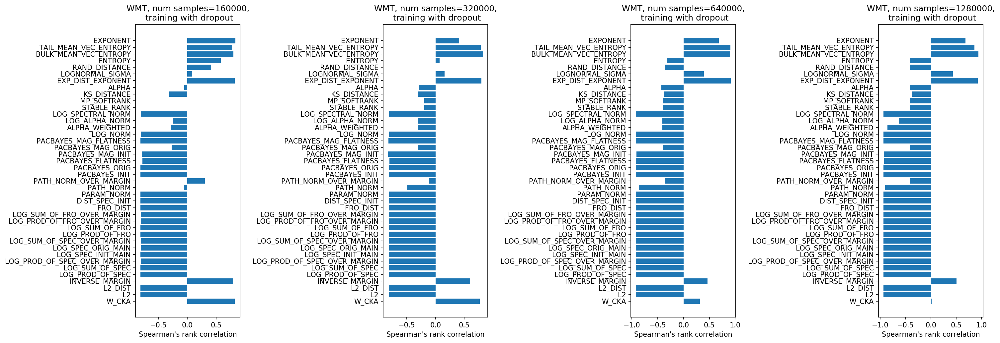

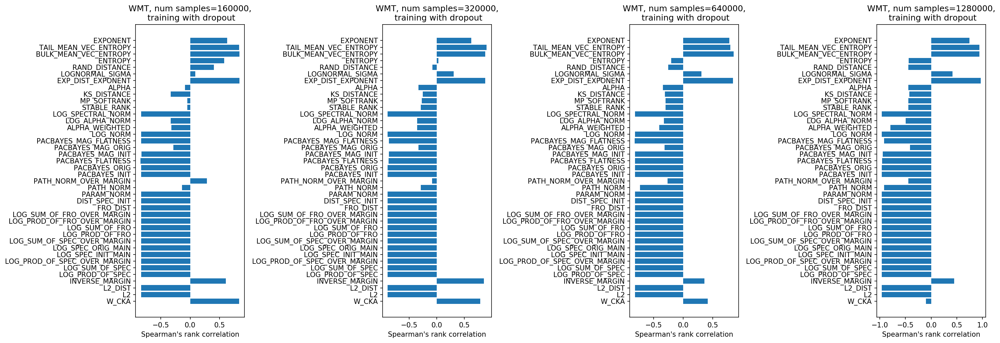

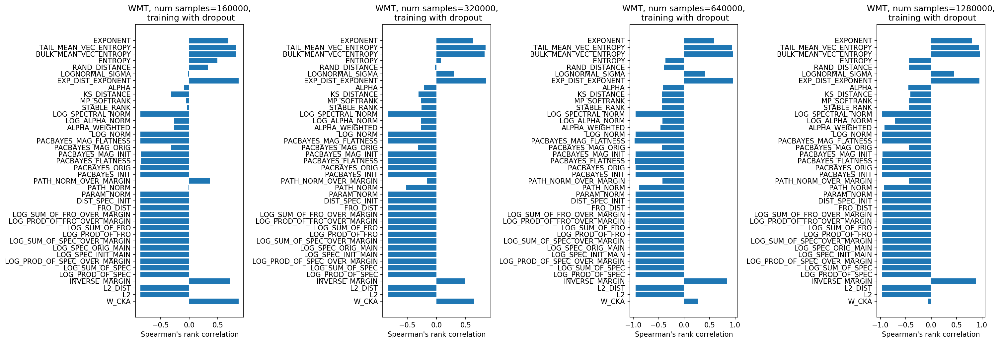

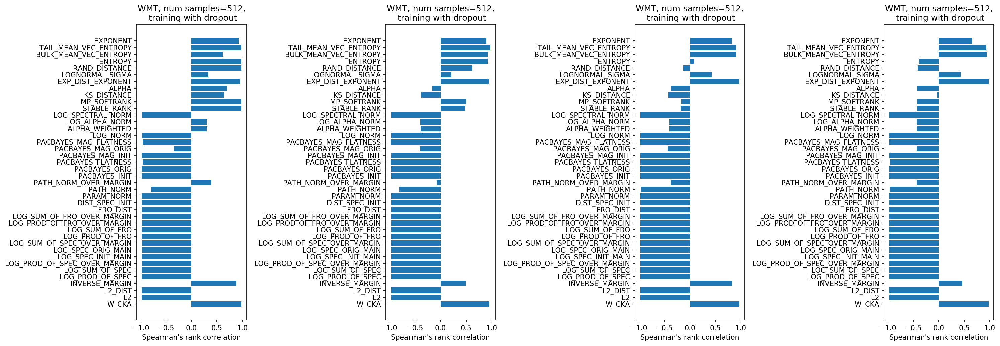

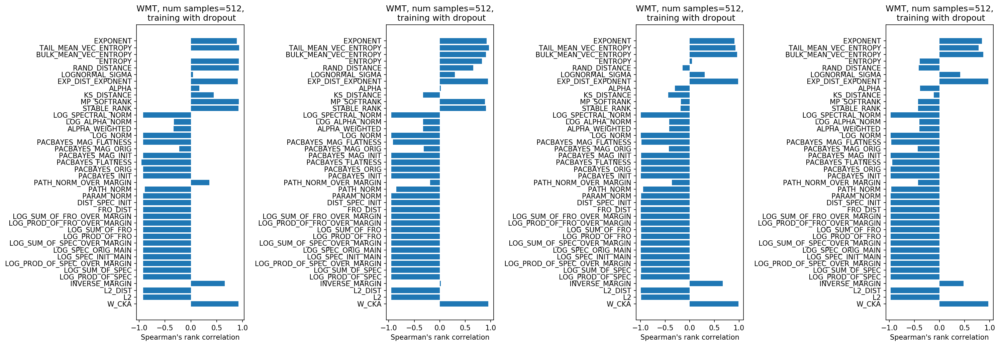

...

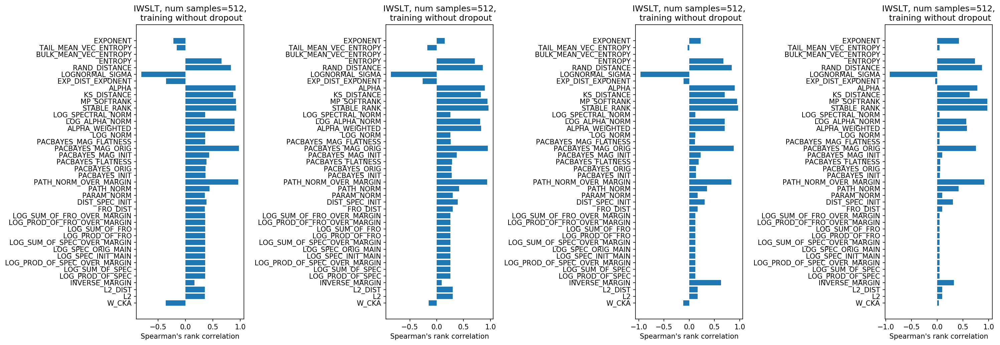

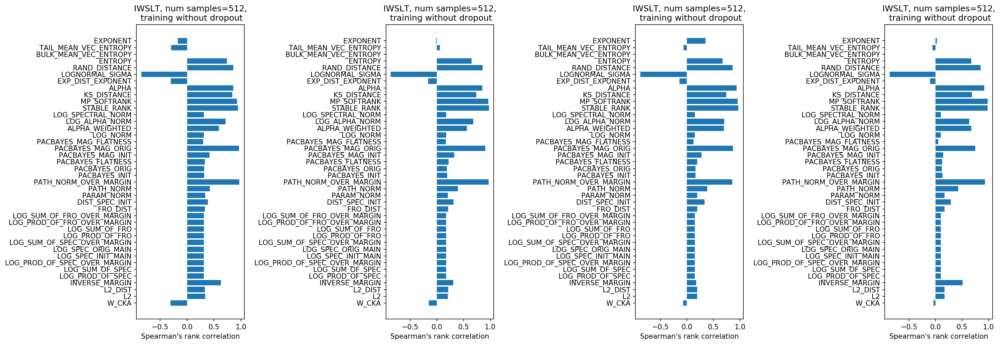

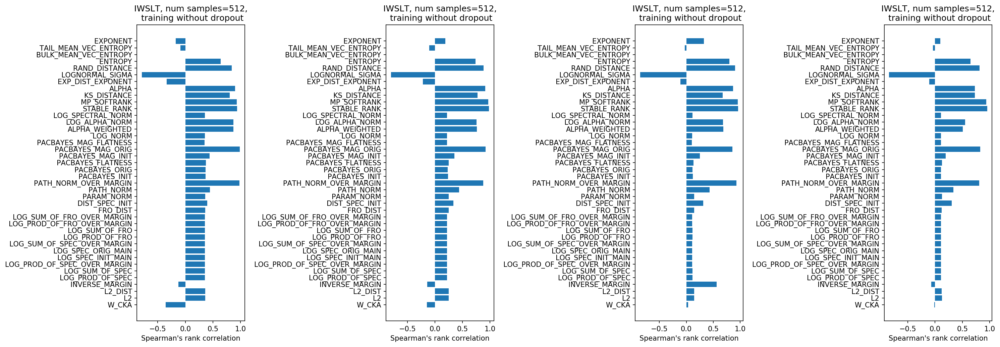

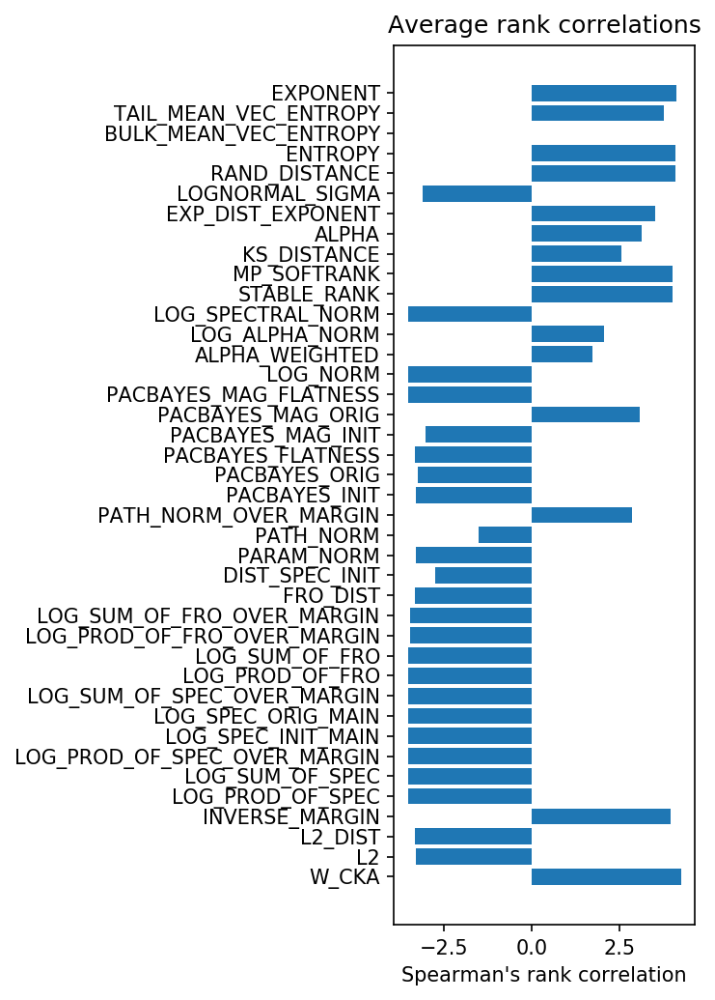

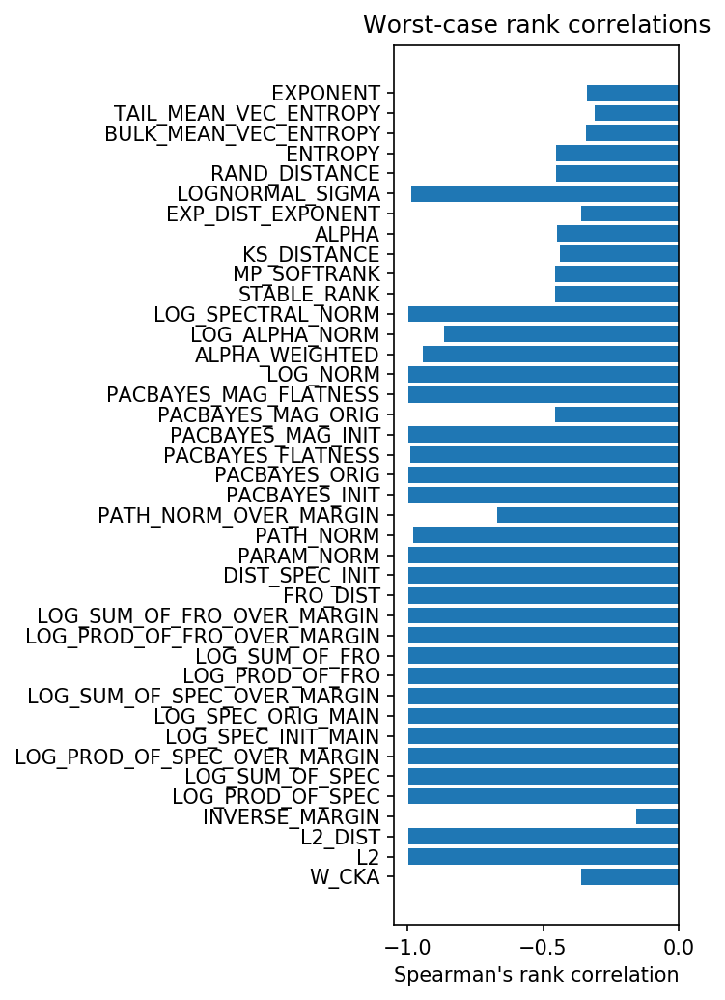

In [180]:
keys = ['log_norm', 'alpha', 'alpha_weighted', 'log_alpha_norm', 'log_spectral_norm', 'stable_rank', 'mp_softrank', 'D']
#single_features = ['rand_distance', 'entropy', 'bulk_mean_vec_entropy', 'bulk_var_vec_entropy', 'tail_mean_vec_entropy', 'tail_var_vec_entropy', 'exponent']
single_features = ['rand_distance', 'entropy', 'bulk_mean_vec_entropy', 'tail_mean_vec_entropy', 'exponent']
exclude_metrics = ['FRO_OVER_SPEC', 'PARAMS', 'alpha', 'TRUE_MARGIN']

rank_correlations_min = {}
rank_correlations_ave = {}
rank_correlations_aggregated = {}

# Summarize one value from each metric here
#computing_summarized_average = False
computing_summarized_average = True
summarized_average_aggregated = {}

# Aggregate the experimental settings
exp_settings = {'width':[], 'samples':[], 'lr':[], 'depth':[], 'dataset':[], 'training_type': []}

bleu_score_type = "test"
#bleu_score_type = "gap"


for training_type in ['normal', 'no_dropout']:
    for dataset in ['WMT', 'IWSLT']:
        
        args = arguments()
        args.training_type = training_type
        args.dataset = dataset
        for experiment_type in ['sample', 'lr', 'depth']:
            for folder_suffix in ['', '_exp2', '_exp3']:
                
                args.experiment_type = experiment_type
                args.IWSLT_width = 512
                args.only20 = True
                #args.correlation_type = 'pearsonr'
                args.correlation_type = 'spearmanr'
                args.folder_suffix = folder_suffix

                if args.training_type=='no_dropout':
                    training_type_suffix = 'without dropout'
                else:
                    training_type_suffix = 'with dropout'

                plt.rcParams['figure.dpi'] = 150
                ckpt_folders, epoch_collections, widths, samples, lr_factors, depths = get_experiment_folders_and_epochs(args)
                
                exp_settings['width'] += widths
                exp_settings['samples'] += samples
                exp_settings['lr'] += lr_factors
                exp_settings['depth'] += depths
                exp_settings['dataset'] += [dataset]*len(widths)
                exp_settings['training_type'] += [training_type]*len(widths)
                
                figs, axs = plt.subplots(1,len(ckpt_folders), figsize=(5*len(ckpt_folders),7))

                for ckpt_folder, epochs, ax in zip(ckpt_folders, epoch_collections, axs):

                    num_samples = re.findall(r'\d+', ckpt_folder)[0]    

                    mypath = os.path.join(ckpt_folder, 'robust_measures_include_margin.pkl')
                    different_metrics = change_dict_form(mypath)

                    # Results after getting the correct margin
                    if args.folder_suffix == '' and args.experiment_type == 'sample':
                        # This is the case when we have "true_margin" as one type of results
                        mypath = os.path.join(ckpt_folder, 'robust_measures_true_margin.pkl')
                        different_metrics2 = change_dict_form(mypath)
                        for key in different_metrics2.keys():
                            if 'MARGIN' in key:
                                different_metrics[key] = different_metrics2[key]

                    plot_result = create_plot_result(keys, single_features, exclude_metrics)
                    loss_result = os.path.join(ckpt_folder, 'log_0.txt')
                    bleu_result = os.path.join(ckpt_folder, 'bleu.pkl')
                    if bleu_score_type == 'gap':
                        get_bleu_gap(plot_result, bleu_result, divide=1)
                    elif bleu_score_type == 'test':
                        get_bleu_score(plot_result, loss_result, divide=1)
                    else:
                        raise ValueError('This BLEU type is not implemented!')

                    for epoch in epochs:
                        #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_rand_distance.pkl')
                        #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results_Charles_fix_finger.pkl')
                        #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30.pkl')
                        #ww_result = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results_continuous30_heuMax_1.pkl')
                        #ww_result = os.path.join(ckpt_folder, 'metrics_new', f'epoch_{epoch}', 'results.pkl')
                        #ww_result = os.path.join(ckpt_folder, 'metrics_expcutoff', f'epoch_{epoch}', 'results.pkl')

                        ww_result1 = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'results.pkl')
                        get_ww_result(plot_result, ww_result1, keys, get_alpha_from_Ds=False)
                        if args.experiment_type != 'sample':
                            for key in single_features:
                                if key!='exponent':
                                    plot_result[key].append( np.mean(get_ww_layer_feature(ww_result1, key=key)))

                        ww_result2 = os.path.join(ckpt_folder, 'metrics_expcutoff', f'epoch_{epoch}', 'results.pkl')
                        if args.experiment_type != 'sample':
                            key = 'exponent'
                            plot_result[key].append( np.mean(get_ww_layer_feature(ww_result2, key=key)))
                        else:
                            for key in single_features:
                                plot_result[key].append( np.mean(get_ww_layer_feature(ww_result2, key=key)))

                        # Add the keys for exponential distribution
                        ww_result3 = os.path.join(ckpt_folder, 'metrics_exponential', f'epoch_{epoch}', 'results.pkl')
                        plot_result['exp_dist_exponent'].append( np.mean(get_ww_layer_feature(ww_result3, key='exponent')))

                        # Add the keys for lognormal distribution
                        ww_result4 = os.path.join(ckpt_folder, 'metrics_lognormal', f'epoch_{epoch}', 'results.pkl')
                        plot_result['lognormal_sigma'].append( np.mean(get_ww_layer_feature(ww_result4, key='sigma_var')))

                    for key in keys:
                        if key == 'D':
                            different_metrics['KS_distance'] = plot_result['D']
                        else:
                            different_metrics[key] = plot_result[key]

                    rank_correlations = compute_rank_correlation(plot_result, different_metrics, exclude_metrics = exclude_metrics, bleu_score_type=bleu_score_type,
                                correlation_type = args.correlation_type, single_features=['exp_dist_exponent','lognormal_sigma']+single_features, 
                                computing_summarized_average=computing_summarized_average, summarized_average_aggregated=summarized_average_aggregated)
                    #rank_correlations = compute_rank_correlation(plot_result, different_metrics, exclude_metrics = exclude_metrics, bleu_score_type=bleu_score_type,
                    #            correlation_type = args.correlation_type, single_features=single_features)


                    aggregate_rank_correlations(rank_correlations, rank_correlations_min, rank_correlations_ave, rank_correlations_aggregated)

                    plot_rank_correlations(rank_correlations, ax)

                    ax.set_title(f"{args.dataset}, num samples={num_samples},\n training {training_type_suffix}")
                    if args.correlation_type == 'pearsonr':
                        ax.set_xlabel('Pearson correlation')
                    elif args.correlation_type == 'spearmanr':
                        ax.set_xlabel("Spearman's rank correlation")
                    #ax.set_xticklabels(plot_keys, rotation=90)

                plt.tight_layout()
                plt.savefig(f"results/Rank_correlation_{args.dataset}_{num_samples}_samples_{args.training_type}.pdf")
        
average_rank_correlations(rank_correlations_ave)

print(rank_correlations_ave)

# Plot average rank correlations
figs, ax = plt.subplots(1,1,figsize=(5,7))
plot_rank_correlations(rank_correlations_ave, ax)

ax.set_title(f"Average rank correlations")
if args.correlation_type == 'pearsonr':
    ax.set_xlabel('Pearson correlation')
elif args.correlation_type == 'spearmanr':
    ax.set_xlabel("Spearman's rank correlation")
plt.tight_layout()
plt.savefig(f"results/Average_rank_correlations.pdf")

# Plot min rank correlations
figs, ax = plt.subplots(1,1,figsize=(5,7))
plot_rank_correlations(rank_correlations_min, ax)

ax.set_title(f"Worst-case rank correlations")
if args.correlation_type == 'pearsonr':
    ax.set_xlabel('Pearson correlation')
elif args.correlation_type == 'spearmanr':
    ax.set_xlabel("Spearman's rank correlation")
plt.tight_layout()
plt.savefig(f"results/Worst_case_rank_correlations.pdf")


# Get the results for all the aggregated rank correlations for plotting

In [ ]:
for key in rank_correlations_aggregated.keys():
    arr = rank_correlations_aggregated[key]
    contain_nan = True if True in np.isnan(arr) else False
    if contain_nan:
        print(key)
        print(arr)
        arr_new = [x for x in arr if math.isnan(x) == False]
        print(arr_new)
        rank_correlations_aggregated[key] = arr_new

In [ ]:
print(rank_correlations_aggregated)

In [ ]:
print(rank_correlations_min)

In [ ]:
print(rank_correlations_ave)

# Get results for summarized average

In [181]:
print(summarized_average_aggregated)

{'bleu_score': [-12.75473122963826, -14.931795841198232, -19.214225929015356, -21.475843644063787, -13.174750777341863, -15.527829289676925, -18.675879015525613, -21.586333834777445, -13.262180449917414, -15.605446459596601, -19.316749939575896, -21.44719078172159, -21.55797230025199, -21.698462356101576, -21.898956981850016, -21.841452165489603, -21.422826433717336, -21.925254509462388, -22.184742742147588, -21.887984945734676, -21.595273380868722, -21.991410537159982, -22.075907108597068, -21.49397766994014, -21.459871671137012, -21.62645617069849, -21.86303755451833, -21.79238487447874, -21.33186664791714, -21.835373850208825, -21.724851572961104, -21.84605639597831, -21.10120229191921, -21.75592717356305, -21.869912120113053, -21.78180646906492, -13.455581742446695, -18.79182250205168, -23.62099670185385, -28.245176795331915, -31.801185824022046, -14.41176133978262, -18.29143793361096, -23.8735289177452, -28.364903758668124, -32.08055322425725, -13.306249519012132, -18.528697176937

In [182]:
for i in range(len(exp_settings['samples'])):
    if exp_settings['samples'][i] == 0:
        exp_settings['samples'][i] = 160000
print(exp_settings)

{'width': [512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512, 512], 'samples': [160000, 320000, 640000, 1280000, 160000, 320000, 640000, 1280000, 160000, 320000, 640000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1280000, 1

In [183]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

In [184]:
color_map = {}
color_map['samples'] = {160000: darkgreen, 320000: yellow, 640000: red, 1280000: black,
                   10000: purple, 20000: green, 40000: blue, 80000: pink}
color_map['lr'] = {1: blue, '0.25': yellow, '0.375': red, '0.5': green, '0.75': black}
color_map['depth'] = {2: yellow, 3: red, 4: green, 5: black, 6: blue}
color_map['dataset'] = {'WMT': blue, 'IWSLT': red}
standard_setting = {'samples':{'IWSLT': 160000, 'WMT': 1280000},
                   'lr': 1, 'depth': 6}

legend_collections = {}
legend_collections['samples'] = {}
legend_collections['samples']['IWSLT'] = [Patch(facecolor=purple, label='samples = 10000'),
                                         Patch(facecolor=green, label='samples = 20000'),
                                         Patch(facecolor=blue, label='samples = 40000'),
                                         Patch(facecolor=pink, label='samples = 80000'),
                                         Patch(facecolor=darkgreen, label='samples = 160000')]
legend_collections['samples']['WMT'] = [Patch(facecolor=black, label='samples = 1280000'),
                                         Patch(facecolor=red, label='samples = 640000'),
                                         Patch(facecolor=yellow, label='samples = 320000'),
                                         Patch(facecolor=darkgreen, label='samples = 160000')]
legend_collections['lr'] = [Patch(facecolor=yellow, label='lr=0.25'),
                            Patch(facecolor=red, label='lr=0.375'),
                            Patch(facecolor=green, label='lr=0.5'),
                            Patch(facecolor=black, label='lr=0.75'),
                            Patch(facecolor=blue, label='lr=1'),]
legend_collections['depth'] = [Patch(facecolor=blue, label='depth=2'),
                            Patch(facecolor=yellow, label='depth=3'),
                            Patch(facecolor=red, label='depth=4'),
                            Patch(facecolor=green, label='depth=5'),
                            Patch(facecolor=black, label='depth=6'),]

In [185]:
def filter_experiments(values_A, values_B, exp_settings_new, criterion):
    values_A = list(compress(values_A, criterion))
    values_B = list(compress(values_B, criterion))
    for key in exp_settings_new.keys():
        exp_settings_new[key] = list(compress(exp_settings_new[key], criterion))
        
    return values_A, values_B, exp_settings_new

In [186]:
def plot_correlation(metric_A, values_A, metric_B, values_B, hyper_parameter = "", 
                     filter_dataset="", filter_training="", only_standard=False, ax=None):
        
    
    assert(len(values_A)==len(values_B))
    exp_settings_new = exp_settings.copy()
    
    if filter_dataset:
        dataset_selection_criterion = [x == filter_dataset for x in exp_settings_new['dataset']]
        values_A, values_B, exp_settings_new = filter_experiments(values_A, values_B, 
                                                                  exp_settings_new, dataset_selection_criterion)
        
    if filter_training:
        dataset_selection_criterion = [x == filter_training for x in exp_settings_new['training_type']]
        values_A, values_B, exp_settings_new = filter_experiments(values_A, values_B, 
                                                                  exp_settings_new, dataset_selection_criterion)
        
    if not hyper_parameter:
        ax.scatter(values_A, values_B)
        rc = compute_correlation_single(values_A, values_B, correlation_type='spearmanr')
        
    else:
        if only_standard:
            assert filter_dataset
            if hyper_parameter == 'samples':
                dataset_selection_criterion = [exp_settings_new['lr'][i] == standard_setting['lr'] and exp_settings_new['depth'][i] == standard_setting['depth'] for i in range(len(exp_settings_new['dataset']))]
                legend = legend_collections['samples'][filter_dataset]
            elif hyper_parameter == 'lr':
                dataset_selection_criterion = [exp_settings_new['samples'][i] == standard_setting['samples'][filter_dataset] and exp_settings_new['depth'][i] == standard_setting['depth'] for i in range(len(exp_settings_new['dataset']))]
                legend = legend_collections['lr']
            elif hyper_parameter == 'depth':
                dataset_selection_criterion = [exp_settings_new['samples'][i] == standard_setting['samples'][filter_dataset] and exp_settings_new['lr'][i] == standard_setting['lr'] for i in range(len(exp_settings_new['dataset']))]
                legend = legend_collections['depth']
                
            values_A, values_B, exp_settings_new = filter_experiments(values_A, values_B, 
                                                                  exp_settings_new, dataset_selection_criterion)
            
            ax.legend(handles=legend, loc='best')
        
        color = [color_map[hyper_parameter][x] for x in exp_settings_new[hyper_parameter]]
        ax.scatter(values_A, values_B, color=color)
        rc = compute_correlation_single(values_A, values_B, correlation_type='spearmanr')
    
    ax.set_xlabel(metric_A)
    ax.set_ylabel(metric_B.lower())
    ax.set_title(metric_B.lower() + f', SP={rc:.2f}'+f'\n{hyper_parameter}, {filter_dataset}, {filter_training}')
    return rc
    

In [187]:
# Check if all the results have the same length
plt.rcParams['figure.dpi'] = 150

num_exps = len(exp_settings['samples'])

num_metrics = len(summarized_average_aggregated.keys())
hyper_parameters = ['samples', 'lr', 'depth']
filter_datasets = ['WMT', 'IWSLT']
filter_trainings = ['normal', 'no_dropout']

num_settings = len(hyper_parameters)*len(filter_datasets)*len(filter_trainings)

figs, axs = plt.subplots(num_metrics-1,num_settings,
                         figsize=(4.5*num_settings,3*(num_metrics-1)))

# Gether results on different hyperparameters
gathered_correlations = {}
for key in summarized_average_aggregated.keys():
    if key!='bleu_score':
        gathered_correlations[key] = []

col = 0
for hyper_parameter in hyper_parameters:
    for filter_dataset in filter_datasets:
        for filter_training in filter_trainings:
            row = 0
            print(f"plot in col {col}")
            for key in summarized_average_aggregated.keys():
                
                #print(key, len(summarized_average_aggregated[key]))
                assert num_exps==len(summarized_average_aggregated[key])
                if key!='bleu_score':
                    rc = plot_correlation('bleu_score', summarized_average_aggregated['bleu_score'], 
                                     key, summarized_average_aggregated[key], 
                                     hyper_parameter=hyper_parameter, filter_dataset=filter_dataset,
                                    only_standard = True, filter_training=filter_training, ax=axs[row, col])
                    row += 1
                    gathered_correlations[key].append(rc)
                    
            col += 1
            
plt.tight_layout()
plt.savefig(f"results/Correlation_plots.pdf")

plot in col 0
plot in col 1
plot in col 2
plot in col 3
plot in col 4
plot in col 5
plot in col 6
plot in col 7
plot in col 8
plot in col 9
plot in col 10
plot in col 11


In [188]:
print(len(summarized_average_aggregated[key]))

150


In [189]:
print(gathered_correlations)

{'W_CKA': [0.8951048951048951, 0.8811188811188813, 0.9785714285714284, 0.9678571428571429, -0.1464285714285714, 0.8285714285714284, -0.8999999999999999, -0.2714285714285714, -0.039285714285714285, 0.28571428571428564, -0.2178571428571428, 0.33571428571428563], 'L2': [0.9090909090909092, 0.9440559440559443, 0.9714285714285713, 0.95, 0.11785714285714284, -0.8321428571428571, 0.8999999999999999, 0.2964285714285714, -0.11785714285714284, -0.38214285714285706, 0.27499999999999997, -0.18214285714285713], 'L2_DIST': [0.9090909090909092, 0.9440559440559443, 0.8749999999999999, 0.95, 0.11785714285714284, -0.8321428571428571, 0.8928571428571428, 0.2964285714285714, -0.075, -0.35357142857142854, 0.2785714285714285, -0.12142857142857141], 'INVERSE_MARGIN': [0.9370629370629372, 0.9440559440559443, 0.9607142857142855, 0.9714285714285713, -0.36428571428571427, 0.7499999999999999, -0.5892857142857142, 0.5714285714285713, 0.08928571428571427, 0.16785714285714282, 0.44999999999999996, 0.0142857142857142

### Plot the results of all the margins

In [ ]:
from PIL import ImageColor


In [ ]:
rgb_red = ImageColor.getcolor(red, "RGB")
rgb_red = [x/255 for x in rgb_red]
rgb_blue = ImageColor.getcolor(blue, "RGB")
rgb_blue = [x/255 for x in rgb_blue]

In [ ]:
figs, ax = plt.subplots(1,1,figsize=(4,3))
for ind, margin_curve in enumerate(all_margins):
    lmbd = ind/20
    color=(rgb_red[0]*lmbd+rgb_blue[0]*(1-lmbd), 
           rgb_red[1]*lmbd+rgb_blue[1]*(1-lmbd),
           rgb_red[2]*lmbd+rgb_blue[2]*(1-lmbd),)
    ax.plot(margin_curve, 'o-', color=color)
    print(color)
    
ax.set_title(f"Margins over training")
ax.set_xlabel('Epochs')
ax.set_ylabel('10 percentile margin')
plt.tight_layout()
plt.savefig(f"results/Margin_vs_epoch.pdf")


figs, ax = plt.subplots(1,1,figsize=(4,3))
for ind, sharpness_curve in enumerate(all_sharpness):
    ax.plot(sharpness_curve, 'o-', color=(ind/20+0.1, 0.1+ind/20, 1.0-ind/20))
    
ax.set_title(f"Sharpness over training")
ax.set_xlabel('Epochs')
ax.set_ylabel('PAC-Bayes Flatness')
plt.tight_layout()
plt.savefig(f"results/Flatness_vs_epoch.pdf")

# alpha values for models trained on Computer vision

In [ ]:
mypath = '/scratch/yyaoqing/model_zoo/epoch_200/normal/ResNet50/metrics/epoch_10/'
all_layers = get_all_layers(mypath)

In [ ]:
args = arguments()
args.experiment_type = 'CV'
#ckpt_folder = '/scratch/yyaoqing/model_zoo/epoch_200/normal/ResNet18/'
ckpt_folder = '/scratch/yyaoqing/model_zoo/epoch_200/normal/ResNet50/'
epochs = [x for x in range(10, 210, 10)]

ckpt_folders, epoch_collections = [ckpt_folder, ckpt_folder], [epochs, epochs]
#plt.rcParams['figure.dpi'] = 50
#plot_once(args, ckpt_folders, epoch_collections, draw_per_epoch=True)

# ESD results for all the layers together
plt.rcParams['figure.dpi'] = 150
ckpt_folder, epochs = ckpt_folders[0], epoch_collections[0]
print(ckpt_folder, epochs)
plot_all_layers(ckpt_folder, epochs=epochs, layer_ids = all_layers[20:40], ESD_type = 1, 
                save='results/ALL_LAYERS_RESNET50.png')

## Plotting single result

In [ ]:
def plot_train_val(ckpt_folder):
    
    loss_result = os.path.join(ckpt_folder, 'log_0.txt')

    plot_result = {}
    get_train_loss(plot_result, loss_result)
    get_val_loss(plot_result, loss_result)
    get_bleu_score(plot_result, loss_result)

    num_epochs = len(plot_result['validation_loss'])

    plt.figure(figsize=(5,5))
    plt.plot(np.arange(1,num_epochs+1), plot_result['validation_loss'], label = 'validation loss')
    plt.plot(np.arange(1,num_epochs), plot_result['bleu_score'], label = 'BLEU score')
    plt.xlabel("Training epochs")
    plt.ylabel("Value")
    plt.plot(np.linspace(0, num_epochs, len(plot_result['training_loss'])), plot_result['training_loss'], label = 'training loss')
    plt.plot(np.linspace(0,200,1000), [min(plot_result['validation_loss'])]*len(np.linspace(0,200,1000)))
    #ax.plot(, plot_result[key], label=key) 
    plt.ylim([0,15])
    plt.legend()

### what happens if we apply the sharpness transform?
### after using sharpness transform

In [ ]:
ckpt_folder = './debug_results_Sharpness_w128/'
plot_train_val(ckpt_folder)

### not using the sharpness transform

In [ ]:
ckpt_folder = './debug_results_noSharpness_w128/'
plot_train_val(ckpt_folder)

### using sharpness transform on WMT data

In [ ]:
ckpt_folder = './debug_results_WMT_Sharpness_w512/'
plot_train_val(ckpt_folder)

### using sharpness transform on WMT data, per batch

In [ ]:
ckpt_folder = './debug_results_WMT_Sharpness_perbatch_w512/'
plot_train_val(ckpt_folder)

## Check all the layer results for the BERT fine-tuning

In [ ]:
mypath = '../checkpoint/BERT_finetune/clean/metrics/epoch_0/'
all_layers = get_all_layers(mypath)
all_layers_square = get_all_layers_square(mypath)

In [ ]:
# ESD results for all the layers together
plt.rcParams['figure.dpi'] = 150
ckpt_folder = '../checkpoint/BERT_finetune/clean/'  #'metrics/epoch_1'
epochs = [0,1,2,3,4,5,6,7,8,9]
print(ckpt_folder, epochs)
plot_all_layers(ckpt_folder, epochs, layer_ids = all_layers[60:80], ESD_type = 1, 
                save='results/ALL_LAYERS_BERT_FINETUNE_ESD_60_80.png')

## SVDSmoothing on the models trained from scratch

In [ ]:
import os
import pickle
import matplotlib.pyplot

In [ ]:
def analyze_SVDSmoothing_file(file_name):
    
    print(file_name)
    with open(file_name, 'r') as f:
        lines = f.readlines()
        for line in lines:
            x = line.split(" ")
            if "Validation" in x and "loss" in x and 'at' in x:
                Smooth_val = float(x[-1])
            if "BLEU" in x and "score" in x and 'is' in x:
                Smooth_BLEU = float(x[-1])
    
    return Smooth_val, Smooth_BLEU

In [ ]:
def find_int(x):
    return int(re.search(r'\d+', x).group())

In [ ]:
def find_epochs(ckpt_folder):
    
    epoch_folder = os.path.join(ckpt_folder, 'metrics/')
    lst = os.listdir(epoch_folder)
    epochs = [find_int(x) for x in lst]
    epochs.sort()
    return epochs

In [ ]:
def plot_SVD_smoothing(ckpt_folder, ax, title):
    
    loss_result = os.path.join(ckpt_folder, 'log_0.txt')

    plot_result = {}
    get_train_loss(plot_result, loss_result)
    get_val_loss(plot_result, loss_result)
    get_bleu_score(plot_result, loss_result)
    
    # Find epochs from folder
    epochs = find_epochs(ckpt_folder)
    
    Smooth_vals = []
    Smooth_BLEUs = []
    for epoch in epochs:
        SVDSmoothing_file_name = os.path.join(ckpt_folder, 'metrics', f'epoch_{epoch}', 'SVDsmoothing_RMT.log')
        Smooth_val, Smooth_BLEU = analyze_SVDSmoothing_file(SVDSmoothing_file_name)
        Smooth_vals.append(Smooth_val)
        Smooth_BLEUs.append(Smooth_BLEU)

    num_epochs = len(plot_result['validation_loss'])

    ax.plot(np.arange(1,num_epochs+1), plot_result['validation_loss'], label = 'validation loss', color='r')
    ax.plot([x+1 for x in epochs], Smooth_vals, label = 'SVDSmoothing loss')
    #plt.plot([x+1 for x in epochs], Smooth_BLEUs, label = 'SVDSmoothing BLEU')
    #plt.plot(np.arange(1,num_epochs), plot_result['bleu_score'], label = 'BLEU score')
    ax.set_xlabel("Training epochs")
    ax.set_ylabel("Loss")
    ax.plot(np.linspace(0, num_epochs-1, len(plot_result['training_loss'])), plot_result['training_loss'], label = 'training loss', color='g')
    #ax.plot(, plot_result[key], label=key) 
    ax.set_ylim([0,7])
    ax.set_title(title)
    ax.legend()

In [ ]:
fig, axs = plt.subplots(1,5, figsize=(25,5))

for i, num_samples in enumerate([10000, 20000, 40000, 80000, 160000]):
#for i, num_samples in enumerate([160000, 10000, 20000, 40000]):
    
    ckpt_folder = f'../checkpoint/NMT_epochs/IWSLT_sample_{num_samples}/w512/normal/'
    plot_SVD_smoothing(ckpt_folder, axs[i], title=f'IWSLT {num_samples} samples')

# Plotting the localization ratios

In [ ]:
name = 'eigs'
#name = 'loc_ratio'

plt.rcParams['figure.dpi'] = 300
mypath = '../checkpoint/NMT_epochs/IWSLT_sample_160000/w512/normal/metrics/epoch_5'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f)) and name in f]
num_cols = 5
num_rows = len(onlyfiles)//num_cols +1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*2.5, num_rows*2.5))
for fig_id, f in enumerate(onlyfiles):
    file_name = os.path.join(mypath, f)
    row = fig_id//num_cols
    col = fig_id%num_cols
    
    img = mpimg.imread(file_name)
    axs[row, col].imshow(img)
    axs[row, col].axis('off')
    
plt.tight_layout()
plt.savefig(f'{name}.png')